# House Price Prediction Dataset

We are going to bulit a model to predict price of a  based on the Kaggle Data for [House price prediction using Advanced Regression](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques) Dataset.

Target : **SalePrice**

In [6]:
# Importing basic needed Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

In [7]:
test_df = pd.read_csv("test.csv")
train_df = pd.read_csv("train.csv")

In [8]:
print(f"Test Data Shape : {test_df.shape}")
print(f"Train data Shape : {train_df.shape}")

Test Data Shape : (1459, 80)
Train data Shape : (1460, 81)


In [9]:
test_df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [10]:
test_df.tail(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1454,2915,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,546.0,546.0,GasA,Gd,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,2916,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,252.0,Unf,0.0,294.0,546.0,GasA,TA,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.0,Unf,1.0,286.0,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,2917,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,1224.0,Unf,0.0,0.0,1224.0,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.0,0.0,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.0,Unf,2.0,576.0,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,2918,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,NaN,0.0,TA,TA,PConc,Gd,TA,Av,GLQ,337.0,Unf,0.0,575.0,912.0,GasA,TA,Y,SBrkr,970,0,0,970,0.0,1.0,1,0,3,1,TA,6,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,80,32,0,0,0,0,NaN,MnPrv,Shed,700,7,2006,WD,Normal
1458,2919,60,RL,74.0,9627,Pave,NaN,Reg,Lvl,AllPub,Inside,Mod,Mitchel,Norm,Norm,1Fam,2Story,7,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,BrkFace,94.0,TA,TA,PConc,Gd,TA,Av,LwQ,758.0,Unf,0.0,238.0,996.0,GasA,Ex,Y,SBrkr,996,1004,0,2000,0.0,0.0,2,1,3,1,TA,9,Typ,1,TA,Attchd,1993.0,Fin,3.0,650.0,TA,TA,Y,190,48,0,0,0,0,NaN,NaN,NaN,0,11,2006,WD,Normal


In [ ]:
train_df.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [12]:
train_df.tail(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1459,1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [13]:
train_df.sample(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
933,934,20,RL,63.0,8487,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,CollgCr,Norm,Norm,1Fam,1Story,7,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,210.0,Gd,TA,PConc,Gd,TA,Av,GLQ,20,Unf,0,1480,1500,GasA,Ex,Y,SBrkr,1500,0,0,1500,0,0,2,0,3,1,Gd,6,Typ,0,NaN,Attchd,2004.0,RFn,2,570,TA,TA,Y,192,36,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Normal,190000
223,224,20,RL,70.0,10500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,6,1971,1971,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,524,LwQ,180,160,864,GasA,Gd,Y,SBrkr,864,0,0,864,0,0,1,0,2,1,TA,4,Typ,0,NaN,Detchd,1989.0,Unf,2,576,TA,TA,Y,216,0,0,0,0,0,NaN,NaN,NaN,0,3,2009,WD,Abnorml,97000
1346,1347,20,RL,NaN,20781,Pave,NaN,IR2,Lvl,AllPub,CulDSac,Gtl,NWAmes,PosN,Norm,1Fam,1Story,7,7,1968,2003,Hip,CompShg,BrkFace,HdBoard,NaN,0.0,TA,TA,CBlock,TA,TA,No,BLQ,297,Rec,68,1203,1568,GasA,TA,Y,SBrkr,2156,0,0,2156,0,0,2,0,3,1,TA,9,Typ,1,Gd,Attchd,1968.0,RFn,2,508,Gd,TA,Y,0,80,0,290,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal,262500
1208,1209,20,RL,70.0,7763,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1962,1980,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,Gd,CBlock,TA,TA,No,Rec,504,BLQ,108,319,931,GasA,TA,Y,SBrkr,1283,0,0,1283,1,0,1,0,3,1,TA,6,Typ,0,NaN,Detchd,1980.0,Unf,2,506,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal,140000
995,996,50,RL,51.0,4712,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,BrkSide,Feedr,Norm,1Fam,1.5Fin,4,7,1946,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,384,Unf,0,363,747,GasA,TA,Y,SBrkr,774,456,0,1230,1,0,1,1,3,1,TA,5,Typ,0,NaN,Detchd,1946.0,Unf,1,305,TA,TA,Y,0,57,0,0,63,0,NaN,MnPrv,NaN,0,8,2006,WD,Abnorml,121600


In [14]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC


# Initial Observation

### *Shape of the Data*
- Test Data Size = 1459 Data entries with 80
- Train data Shape = 1460 Data entries with 81

### *Columns Details*


| Column Name     | No of Null | Dtype   | Column Name     | No of Null | Dtype   |
|-----------------|------------|---------|-----------------|------------|---------|
| Id              | 0          | int64   | Heating         | 0          | object  |
| MSSubClass      | 0          | int64   | HeatingQC       | 0          | object  |
| MSZoning        | 0          | object  | CentralAir      | 0          | object  |
| LotFrontage     | 259        | float64 | Electrical      | 1          | object  |
| LotArea         | 0          | int64   | 1stFlrSF        | 0          | int64   |
| Street          | 0          | object  | 2ndFlrSF        | 0          | int64   |
| Alley           | 1369       | object  | LowQualFinSF    | 0          | int64   |
| LotShape        | 0          | object  | GrLivArea       | 0          | int64   |
| LandContour     | 0          | object  | BsmtFullBath    | 0          | int64   |
| Utilities       | 0          | object  | BsmtHalfBath    | 0          | int64   |
| LotConfig       | 0          | object  | FullBath        | 0          | int64   |
| LandSlope       | 0          | object  | HalfBath        | 0          | int64   |
| Neighborhood    | 0          | object  | BedroomAbvGr    | 0          | int64   |
| Condition1      | 0          | object  | KitchenAbvGr    | 0          | int64   |
| Condition2      | 0          | object  | KitchenQual     | 0          | object  |
| BldgType        | 0          | object  | TotRmsAbvGrd    | 0          | int64   |
| HouseStyle      | 0          | object  | Functional      | 0          | object  |
| OverallQual     | 0          | int64   | Fireplaces      | 0          | int64   |
| OverallCond     | 0          | int64   | FireplaceQu     | 690        | object  |
| YearBuilt       | 0          | int64   | GarageType      | 81         | object  |
| YearRemodAdd    | 0          | int64   | GarageYrBlt     | 81         | float64 |
| RoofStyle       | 0          | object  | GarageFinish    | 81         | object  |
| RoofMatl        | 0          | object  | GarageCars      | 0          | int64   |
| Exterior1st     | 0          | object  | GarageArea      | 0          | int64   |
| Exterior2nd     | 0          | object  | GarageQual      | 81         | object  |
| MasVnrType      | 872        | object  | GarageCond      | 81         | object  |
| MasVnrArea      | 8          | float64 | PavedDrive      | 0          | object  |
| ExterQual       | 0          | object  | WoodDeckSF      | 0          | int64   |
| ExterCond       | 0          | object  | OpenPorchSF     | 0          | int64   |
| Foundation      | 0          | object  | EnclosedPorch   | 0          | int64   |
| BsmtQual        | 37         | object  | 3SsnPorch       | 0          | int64   |
| BsmtCond        | 37         | object  | ScreenPorch     | 0          | int64   |
| BsmtExposure    | 38         | object  | PoolArea        | 0          | int64   |
| BsmtFinType1    | 37         | object  | PoolQC          | 1453       | object  |
| BsmtFinSF1      | 0          | int64   | Fence           | 1179       | object  |
| BsmtFinType2    | 38         | object  | MiscFeature     | 1406       | object  |
| BsmtFinSF2      | 0          | int64   | MiscVal         | 0          | int64   |
| BsmtUnfSF       | 0          | int64   | MoSold          | 0          | int64   |
| TotalBsmtSF     | 0          | int64   | YrSold          | 0          | int64   |
| Heating         | 0          | object  | SaleType        | 0          | object  |
| HeatingQC       | 0          | object  | SaleCondition   | 0          | object  |
| CentralAir      | 0          | object  | SalePrice       | 0          | int64   |


## Columns with Null Value
| Column Name     | Null Values |
|-----------------|-------------|
| LotFrontAge     | 259 |
| Alley           | 1369|
| ManVnrType      | 872 |
| BsmtQual        | 37  |
| BsmtCond        | 37  |
| BsmtExposure    | 38  |
| BsmtFinType1    | 37  |
| BsmtFinType1    | 38  |
| FireplaceQu     | 690 |
| GarageType      | 81  |
| GarageYrBlt     | 81  |
| GarageFinish    | 81  |
| GarageQual      | 81  |
| GarageCond      | 81  |
| PoolQc          | 1453|
| Fence           | 1179|
| MiscFeature     | 1406|


In [15]:
print(f"No of Duplicated Values in Train Data : {train_df.duplicated().sum()}")
print(f"No of Duplicated Values in Test Data : {test_df.duplicated().sum()}")

No of Duplicated Values in Train Data : 0
No of Duplicated Values in Test Data : 0


In [16]:
train_df.nunique()

Id               1460
MSSubClass         15
MSZoning            5
LotFrontage       110
LotArea          1073
Street              2
Alley               2
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         112
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          3
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        637
BsmtFinType2        6
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          753
2ndFlrSF          417
LowQualFin

In [17]:
columns = train_df.columns

for col in columns:
    print(f"{col} :  {train_df[col].unique()}")

Id :  [   1    2    3 ... 1458 1459 1460]
MSSubClass :  [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
MSZoning :  ['RL' 'RM' 'C (all)' 'FV' 'RH']
LotFrontage :  [ 65.  80.  68.  60.  84.  85.  75.  nan  51.  50.  70.  91.  72.  66.
 101.  57.  44. 110.  98.  47. 108. 112.  74. 115.  61.  48.  33.  52.
 100.  24.  89.  63.  76.  81.  95.  69.  21.  32.  78. 121. 122.  40.
 105.  73.  77.  64.  94.  34.  90.  55.  88.  82.  71. 120. 107.  92.
 134.  62.  86. 141.  97.  54.  41.  79. 174.  99.  67.  83.  43. 103.
  93.  30. 129. 140.  35.  37. 118.  87. 116. 150. 111.  49.  96.  59.
  36.  56. 102.  58.  38. 109. 130.  53. 137.  45. 106. 104.  42.  39.
 144. 114. 128. 149. 313. 168. 182. 138. 160. 152. 124. 153.  46.]
LotArea :  [ 8450  9600 11250 ... 17217 13175  9717]
Street :  ['Pave' 'Grvl']
Alley :  [nan 'Grvl' 'Pave']
LotShape :  ['Reg' 'IR1' 'IR2' 'IR3']
LandContour :  ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities :  ['AllPub' 'NoSeWa']
LotConfig :  ['Inside' 'FR2' 'Corner' '

Our Data is Consistent no Spelling Mistakes, Extra Spaces or Mixed Data Formats.

*Next we are Moving Statistical Summary*

In [18]:
train_df.describe(include='number')

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Observation

| Feature        | Mean | SD | Min | Max | Distribution |
|----------------|------|------|-----|-----|--------------|
| MSSubClass     | 56.90 | 42.30 | 20 | 190 | Right Skewed |
| LotFrontage    | 70.05 | 24.28 | 21 | 313 | Right Skewed |
| LotArea        | 10516.83 | 9981.26 | 1300 | 215245 | Right Skewed |
| OverallQual    | 6.10 | 1.38 | 1 | 10 | Normal |
| OverallCond    | 5.58 | 1.11 | 1 | 9 | Right Skewed |
| YearBuilt      | 1971.27 | 30.20 | 1872 | 2010 | Left Skewed |
| YearRemodAdd   | 1984.87 | 20.65 | 1950 | 2010 | Normal |
| MasVnrArea     | 103.69 | 181.07 | 0 | 1600 | Right Skewed |
| BsmtFinSF1     | 443.64 | 456.10 | 0 | 5644 | Right Skewed |
| BsmtFinSF2     | 46.55 | 161.32 | 0 | 1474 | Right Skewed |
| BsmtUnfSF      | 567.24 | 441.87 | 0 | 2336 | Right Skewed |
| TotalBsmtSF    | 1057.43 | 438.71 | 0 | 6110 | Right Skewed |
| 1stFlrSF       | 1162.63 | 386.59 | 334 | 4692 | Right Skewed |
| 2ndFlrSF       | 346.99 | 436.53 | 0 | 2065 | Right Skewed |
| LowQualFinSF   | 5.84 | 48.62 | 0 | 572 | Right Skewed |
| GrLivArea      | 1515.46 | 525.48 | 334 | 5642 | Right Skewed |
| BsmtFullBath   | 0.43 | 0.52 | 0 | 3 | Right Skewed |
| BsmtHalfBath   | 0.06 | 0.24 | 0 | 2 | Right Skewed |
| FullBath       | 1.57 | 0.55 | 0 | 3 | Normal |
| HalfBath       | 0.38 | 0.50 | 0 | 2 | Right Skewed |
| BedroomAbvGr   | 2.87 | 0.82 | 0 | 8 | Normal |
| KitchenAbvGr   | 1.05 | 0.22 | 0 | 3 | Right Skewed |
| TotRmsAbvGrd   | 6.52 | 1.63 | 2 | 14 | Right Skewed |
| Fireplaces     | 0.61 | 0.64 | 0 | 3 | Right Skewed |
| GarageYrBlt    | 1978.51 | 24.69 | 1900 | 2010 | Left Skewed |
| GarageCars     | 1.77 | 0.75 | 0 | 4 | Normal |
| GarageArea     | 472.98 | 213.80 | 0 | 1418 | Normal |
| WoodDeckSF     | 94.24 | 125.34 | 0 | 857 | Right Skewed |
| OpenPorchSF    | 46.66 | 66.26 | 0 | 547 | Right Skewed |
| EnclosedPorch  | 21.95 | 61.12 | 0 | 552 | Right Skewed |
| 3SsnPorch      | 3.41 | 29.32 | 0 | 508 | Right Skewed |
| ScreenPorch    | 15.06 | 55.76 | 0 | 480 | Right Skewed |
| PoolArea       | 2.76 | 40.18 | 0 | 738 | Right Skewed |
| MiscVal        | 43.49 | 496.12 | 0 | 15500 | Right Skewed |
| SalePrice      | 180921.20 | 79442.50 | 34900 | 755000 | Right Skewed |


Most of the frature were right skewed which need to be fixed before traing the model.

In [19]:
train_df.describe(include="object")
Target = "SalePrice"

**Categorical Columns but Datatype as Integers**

|   Columns     |
|---------------|
|   MSSubClass  |
|   OverallQual |
|   OverallCond |


In [20]:
#Converting Integer types in to Categoty

col = ["MSSubClass", "OverallQual", "OverallCond"]
train_df[col] = train_df[col].astype("category")


In [21]:
#Univariate Analysis

num_cols = train_df.select_dtypes("number").columns
cat_cols = train_df.select_dtypes(include= ("object", "category")).columns

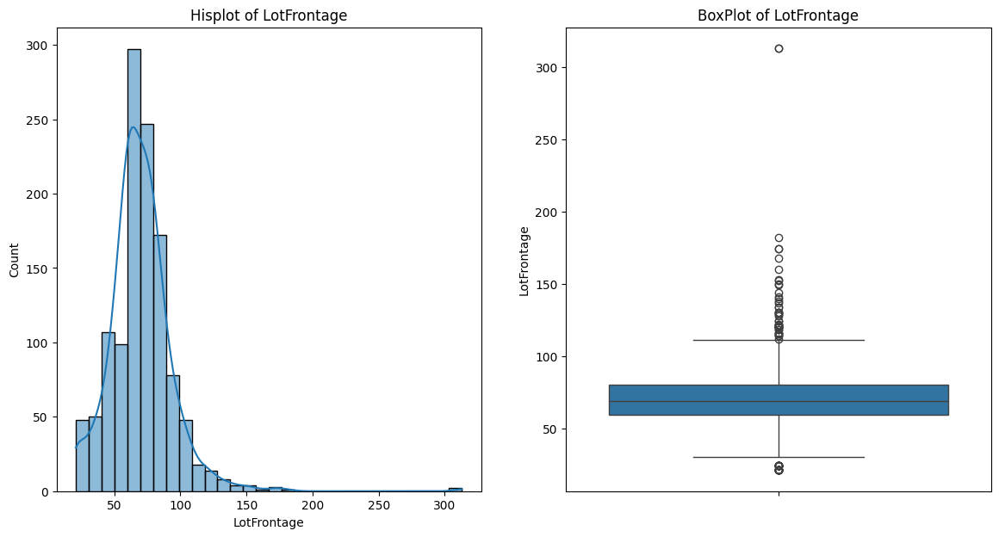

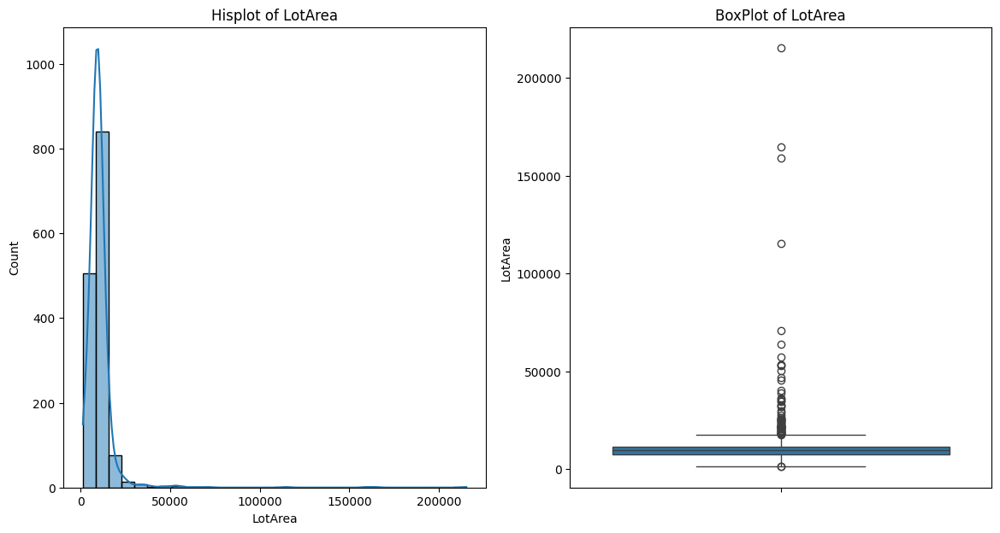

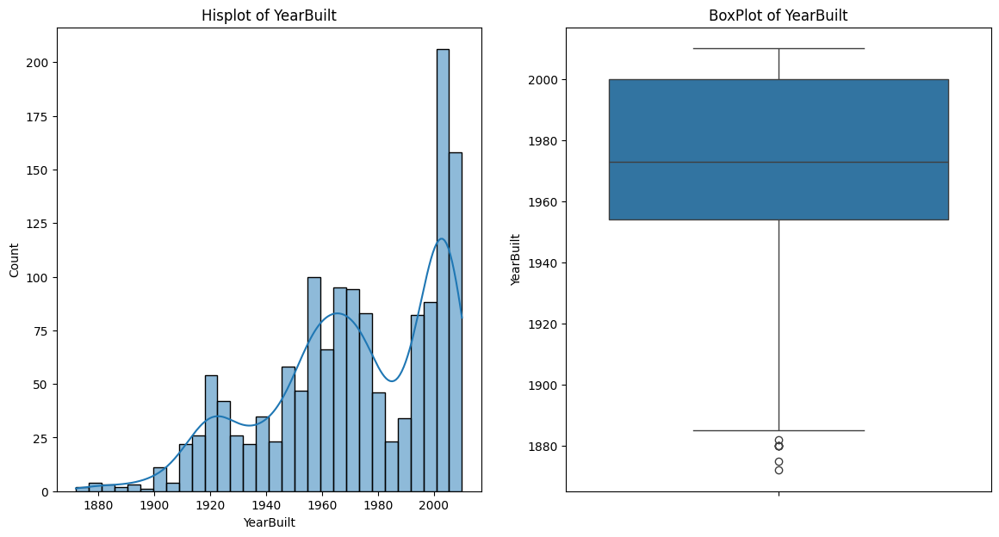

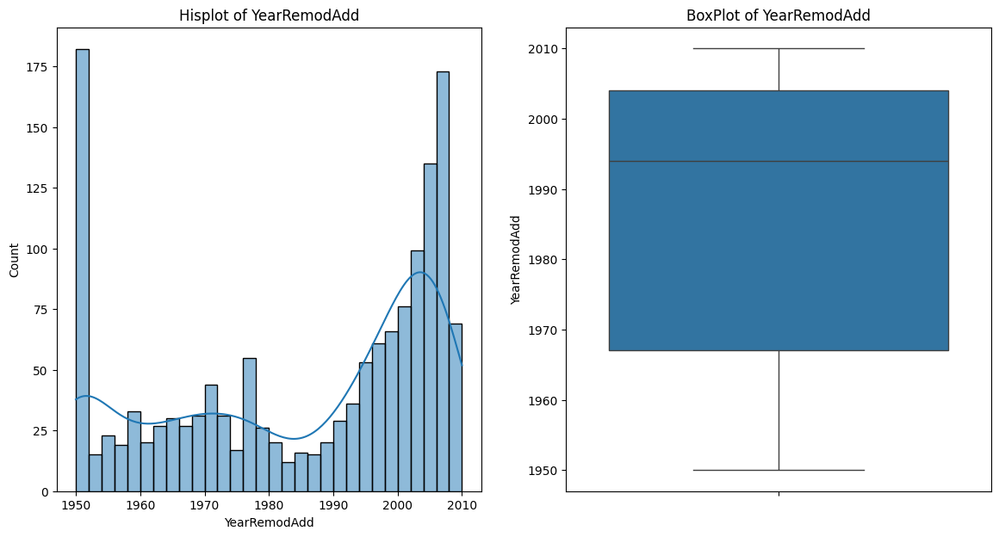

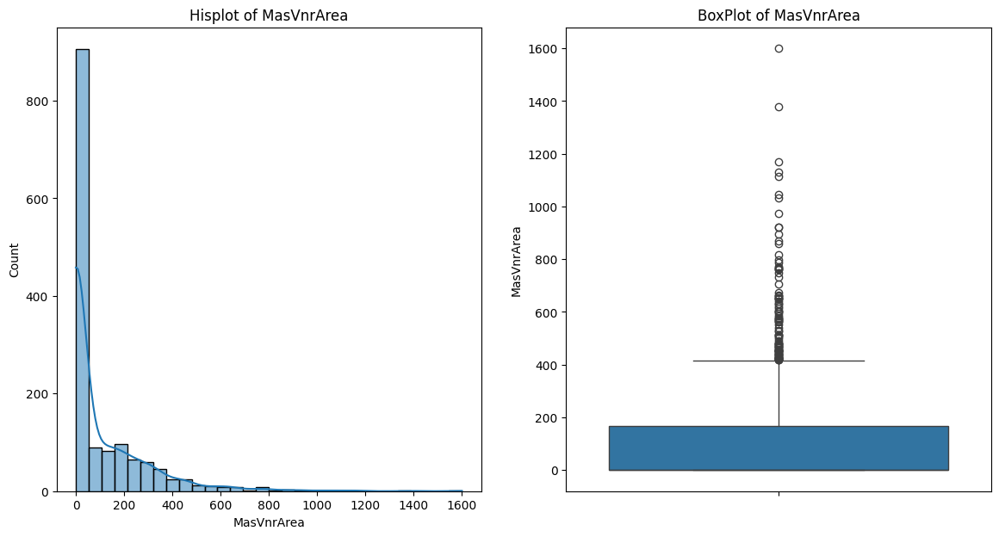

...

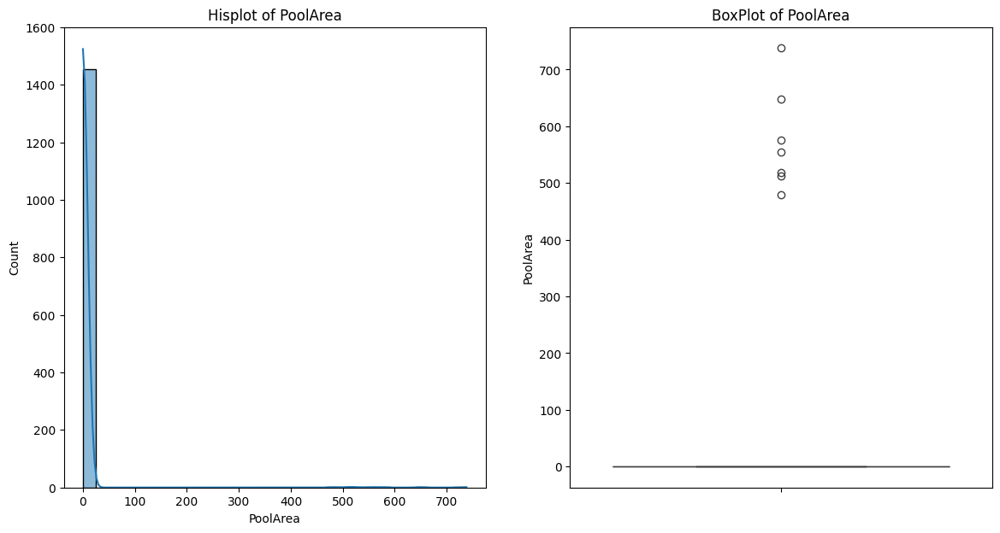

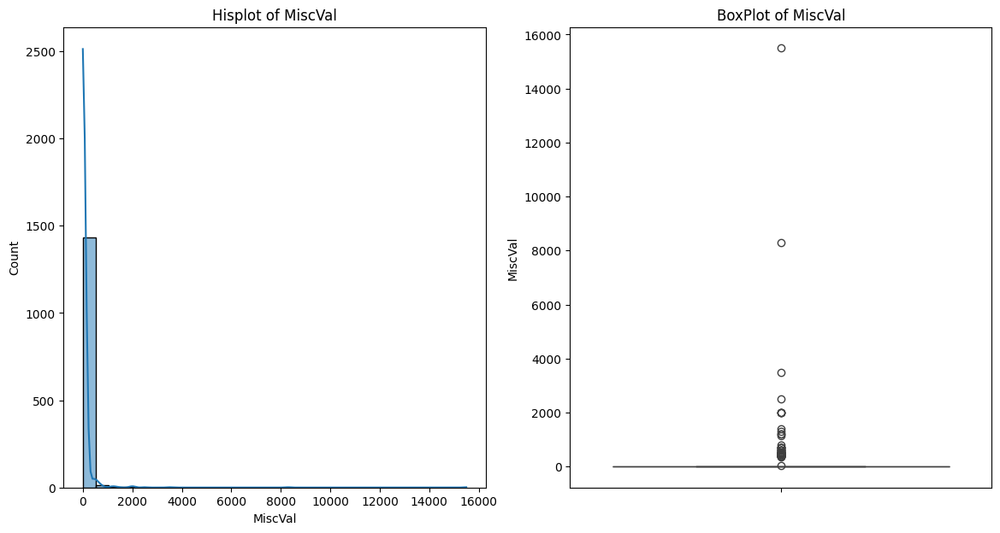

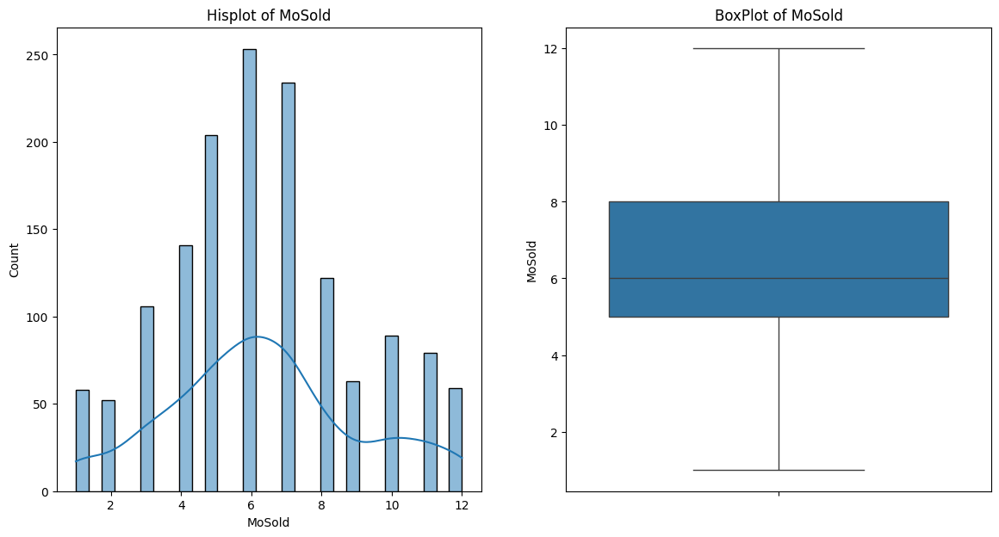

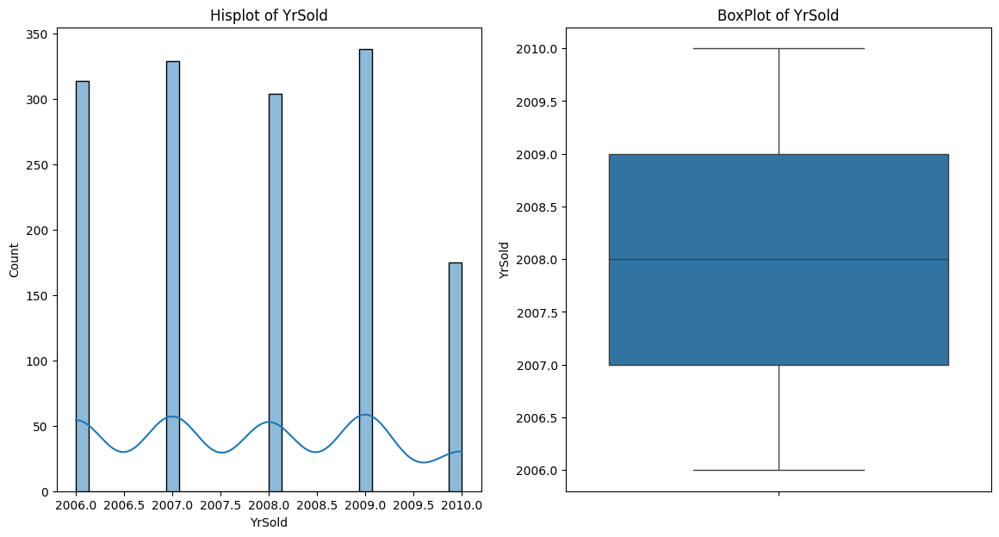

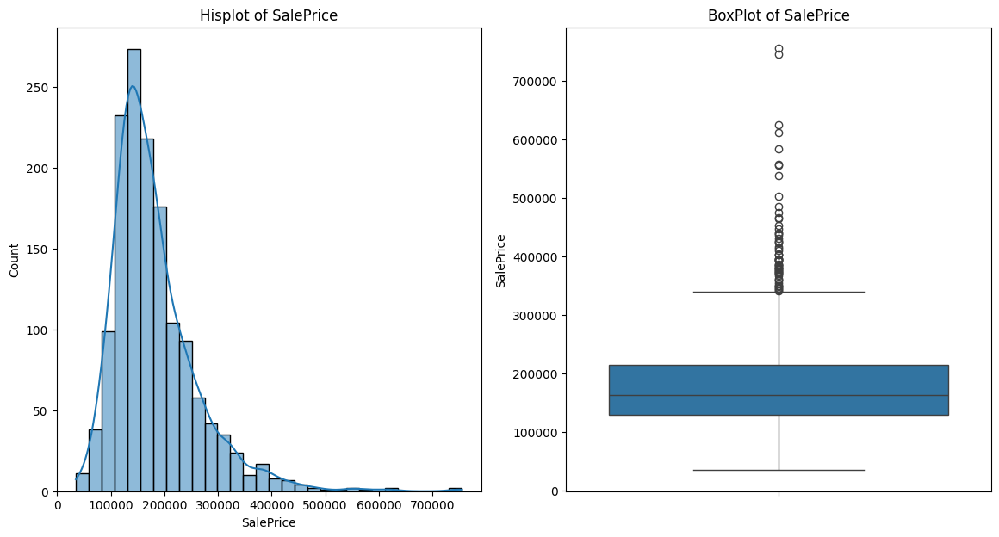

In [22]:
#Univatiate Analysis on numerical Columns
for col in num_cols:
    if col != "Id":
        fig, ax = plt.subplots(1,2,figsize = (14,7))
        sns.histplot(data=train_df, x = col, kde=True, bins=30,  ax=ax[0])
        ax[0].set_title(f"Hisplot of {col}")
        sns.boxplot(data=train_df, y= col, fill=True, ax=ax[1])
        ax[1].set_title(f"BoxPlot of {col}")
        plt.show()

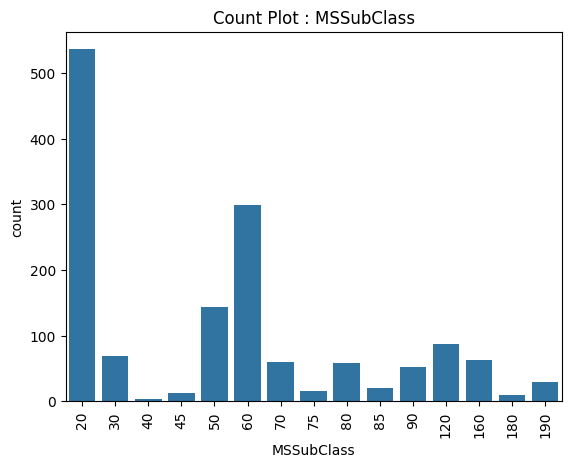

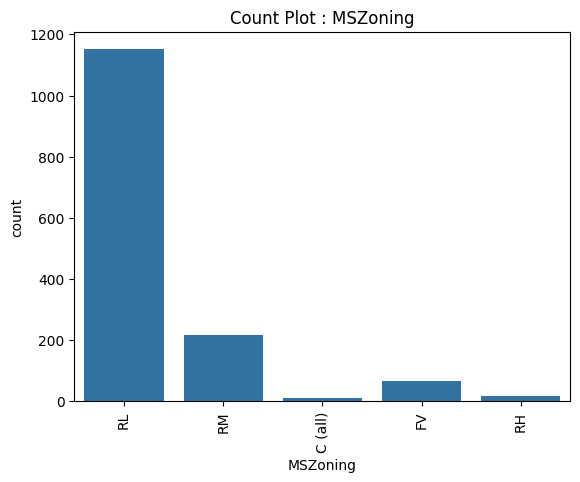

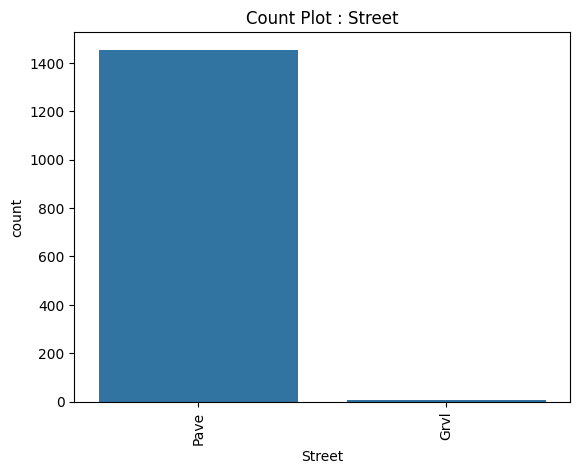

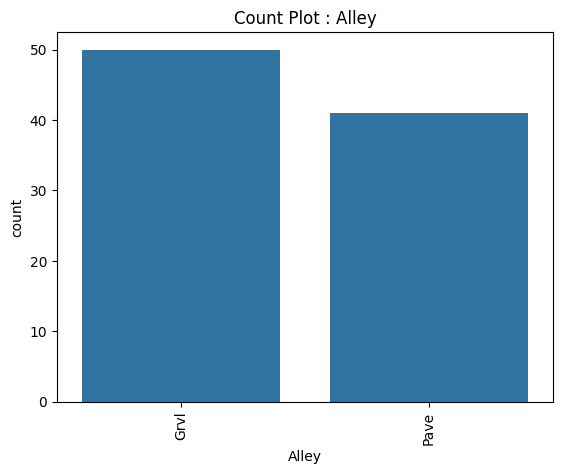

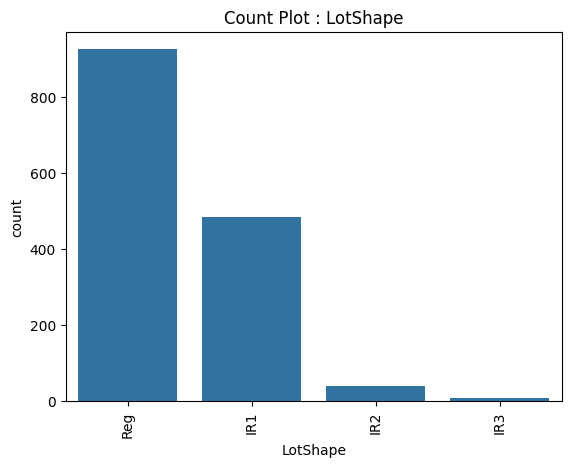

...

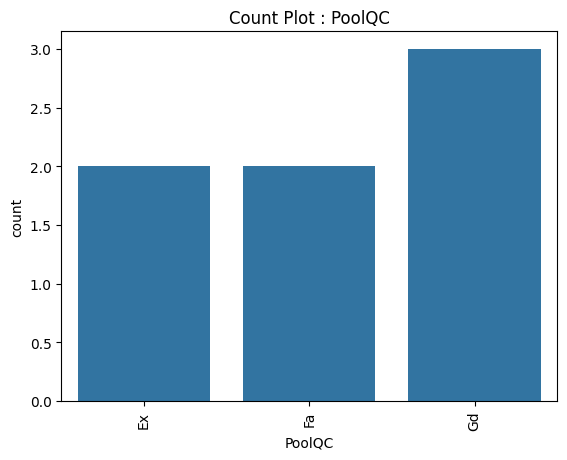

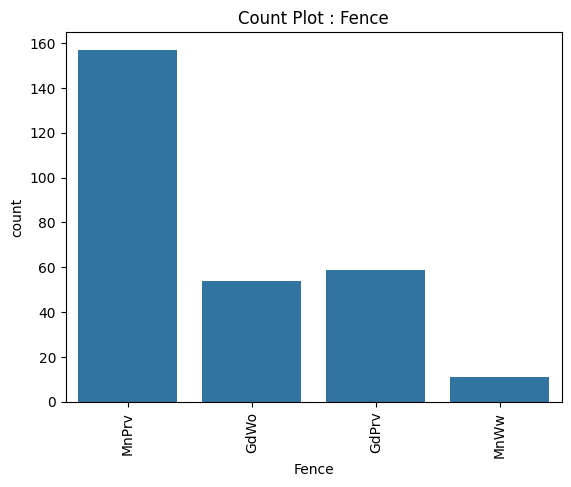

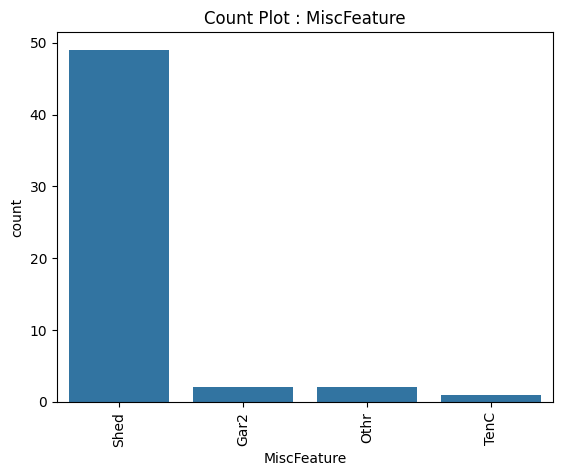

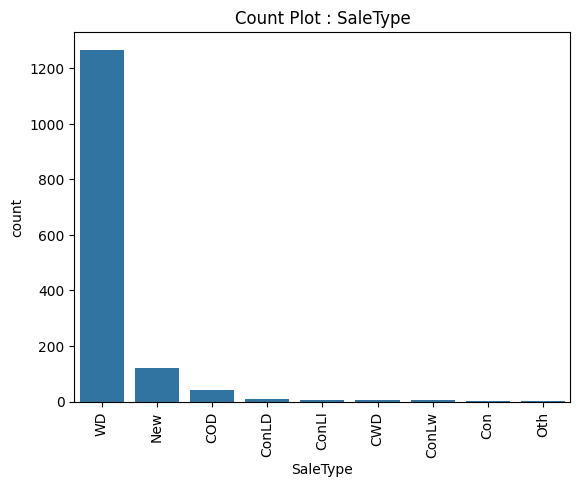

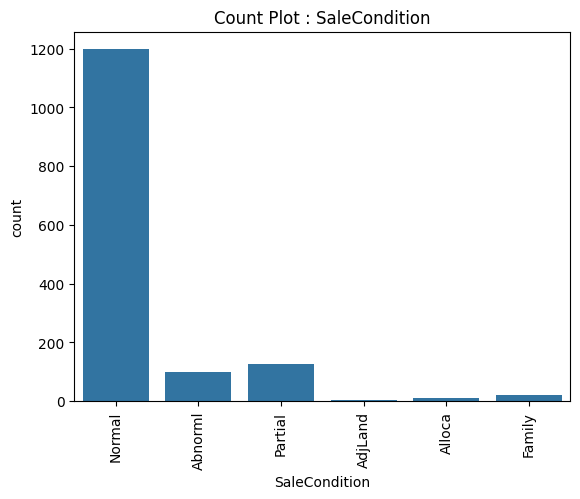

In [23]:
for col in cat_cols:
    sns.countplot(data=train_df, x = col)
    plt.title(f"Count Plot : {col}")
    plt.xticks(rotation = 90)
    plt.show()

## Summary of Numerical Univariate Analysis

- Most houses have moderate frontage (50–100 ft) and lot area above 10,000 sq.ft.
- Many houses were remodeled after 2000.
- A large number of houses lack masonry veneer and basement features, and second basements are rare.
- Most basements are unfinished, and low-quality finished areas are uncommon.
- The majority of houses have living area below 2000 sq.ft, often with no second floor.
- Typical homes contain 2 bathrooms and 3 bedrooms, while multiple kitchens are very rare.
- Most houses include garage space for two or more cars, but pools and fireplaces are uncommon.
- House prices are mainly concentrated around $200,000.

## Summary of Categorical Univariate Analysis

- Most houses belong to MSSubClass types 20, 60, and 50.
- The majority of properties are located in Residential Low Density zones, with fewer in Medium Density areas.
- Nearly all houses are on paved streets, while the Alley feature contains many missing values.
- Around 65% of plots are rectangular, and over 90% are flat in contour.
- All houses have access to public utilities.
- Most properties are located in North Ames, College Creek, and Old Town neighborhoods.
- The majority of houses are sold under normal sale conditions.
- About 90% of houses are single-family homes.
- Overall property quality mainly ranges between 5 and 8.
- Most houses have concrete or cinder block foundations.
- Gas forced warm air is the dominant heating system, and almost all homes have central air conditioning.


Null Handing Stategies:
| Column Name     | Stategies   | Meaning   | 
|-----------------|-------------|-----------|
| LotFrontAge     | Mean        | Average Value |
| Alley           | Drop Columns| Too many Null Value |
| ManVnrType      | Place 'NA'  | No ManVnrType |
| BsmtQual        | Place 'NA'  | No Basement |
| BsmtCond        | Place 'NA'  | No Basement |
| BsmtExposure    | Place 'NA'  | No Basement |
| BsmtFinType1    | Place 'NA'  | No Basement |
| BsmtFinType2    | place 'NA'  | No Basement |
| FireplaceQu     | Place 'NA'  | No Fireplace |
| GarageType      | Place 'NA'  | No Garage  |
| GarageYrBlt     | Place 'NA'  | No Garage  |
| GarageFinish    | Place 'NA'  | No Garage  |
| GarageQual      | Place 'NA'  | No Garage  |
| GarageCond      | Place 'NA'  | No Garage  |
| PoolQc          | Place 'NA'  | No Pool    |
| Fence           | Place 'NA'  | No Fence   |
| MiscFeature     | Place 'NA'  | None       |

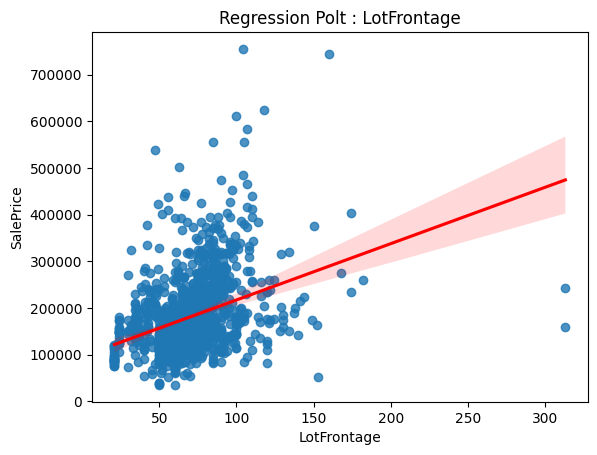

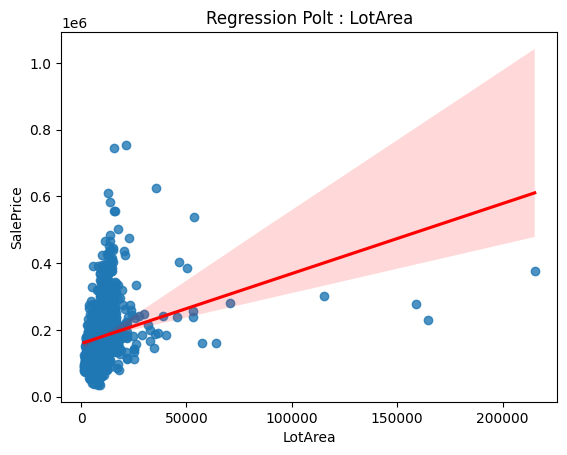

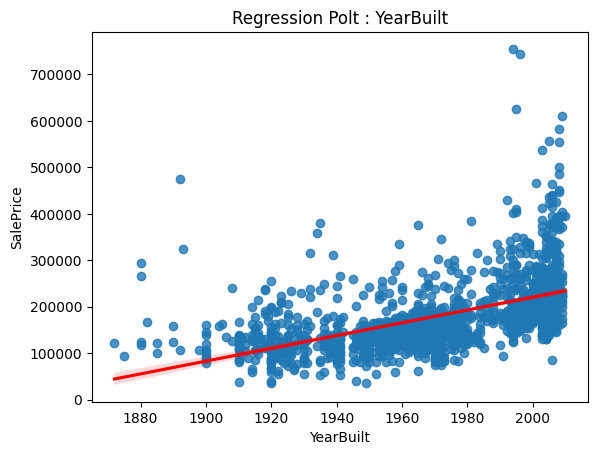

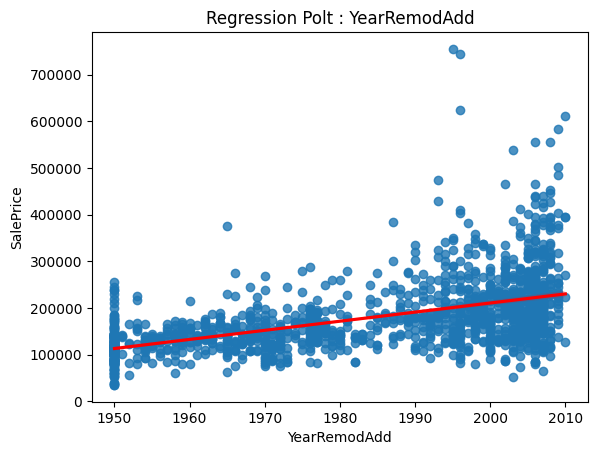

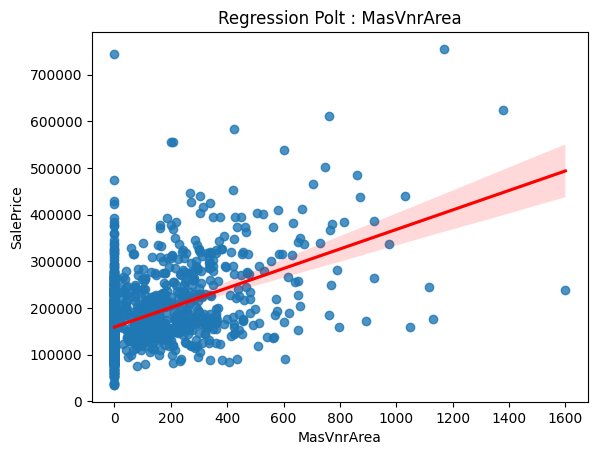

...

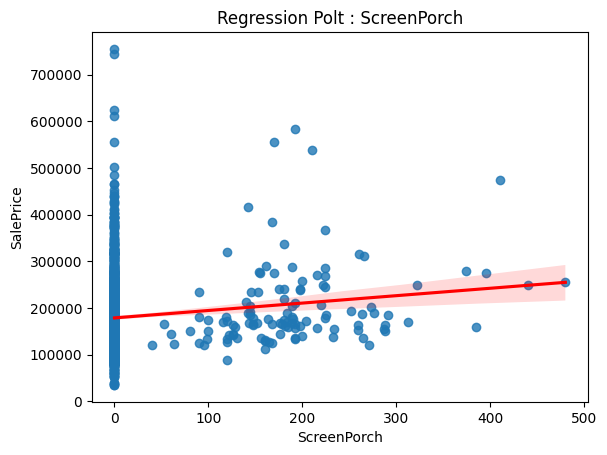

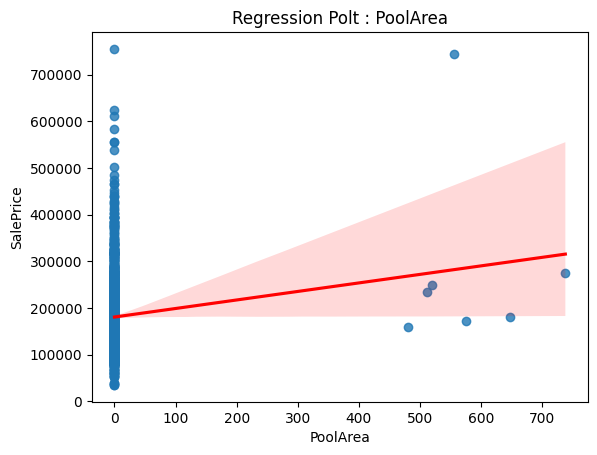

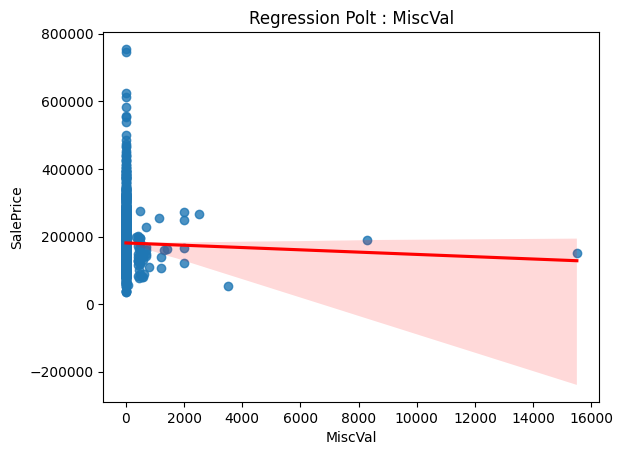

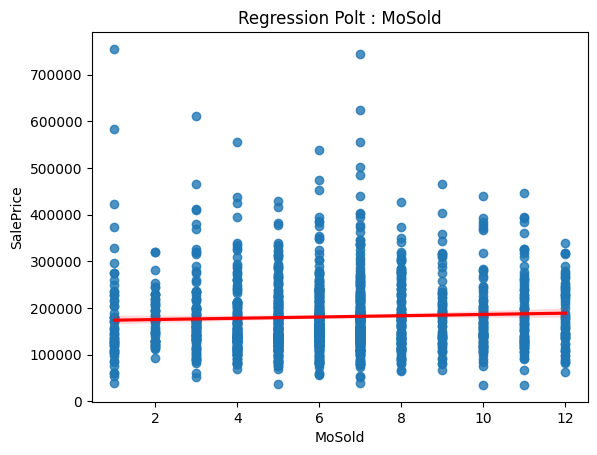

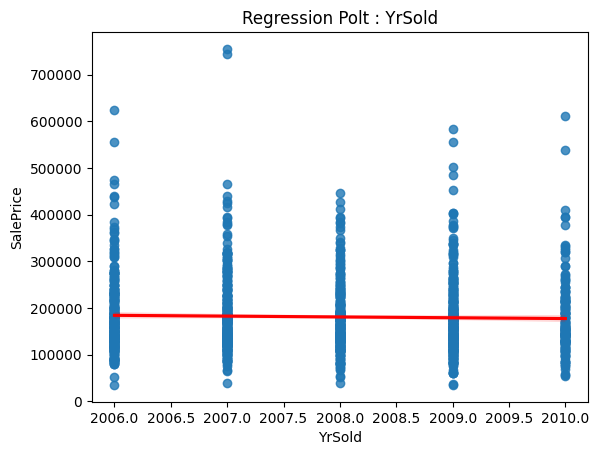

In [24]:
#Bivariate Analysis
for col in num_cols:
    if col not in ('Id', Target):
        sns.regplot(data=train_df, x=col, y=Target, line_kws={'color': 'red'})
        plt.title(f"Regression Polt : {col}")
        plt.show()

# Numerical Univariate Analysis

**Columns with Very Good Relation**
- TotalBsmtSF, 1stFlrSF

**Columns with Good Realtion**
- LotFrontage, LotArea, MasVnrArea, BsmtFinSF1, GrLivArea, GarageCars, GarageArea, OpenPorchSF, FIreplaces, TotalRmsAbvGrd, FullBath 

**Columns with weak Realtion**
- Mosold, Yrsold, ScreenPorch, PoolArea, MiscVal, BsmtHalfBath, BsmtFullBath, LowQualFinSF, 2ndFlrSF, BsmtUnfSF, BsmtFinSF2

**Columns with Negative Relation**
- EnclosedPorch, KitchenAbvGr

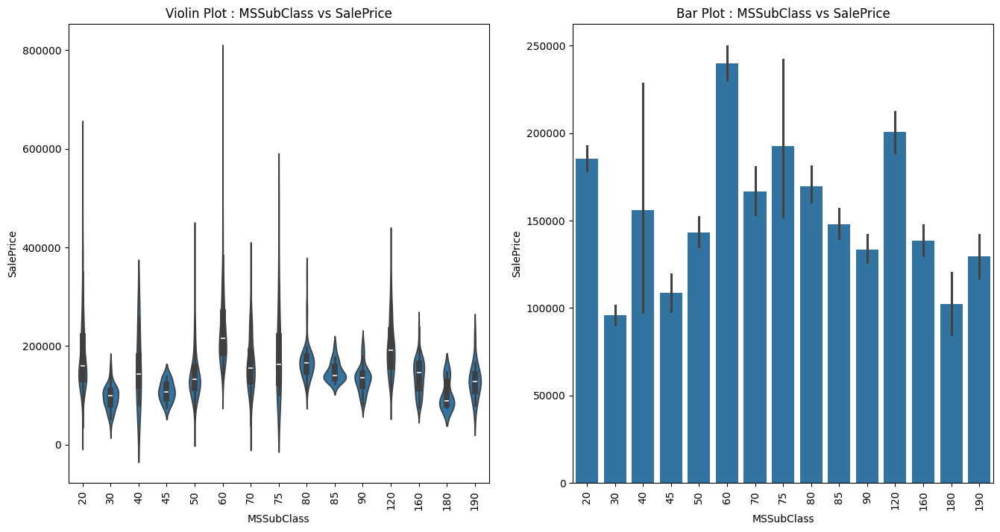

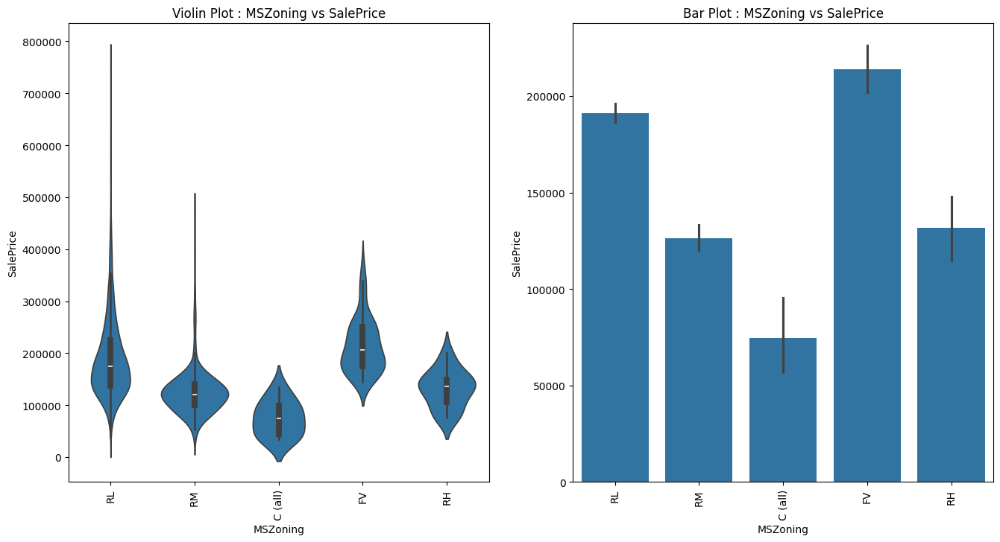

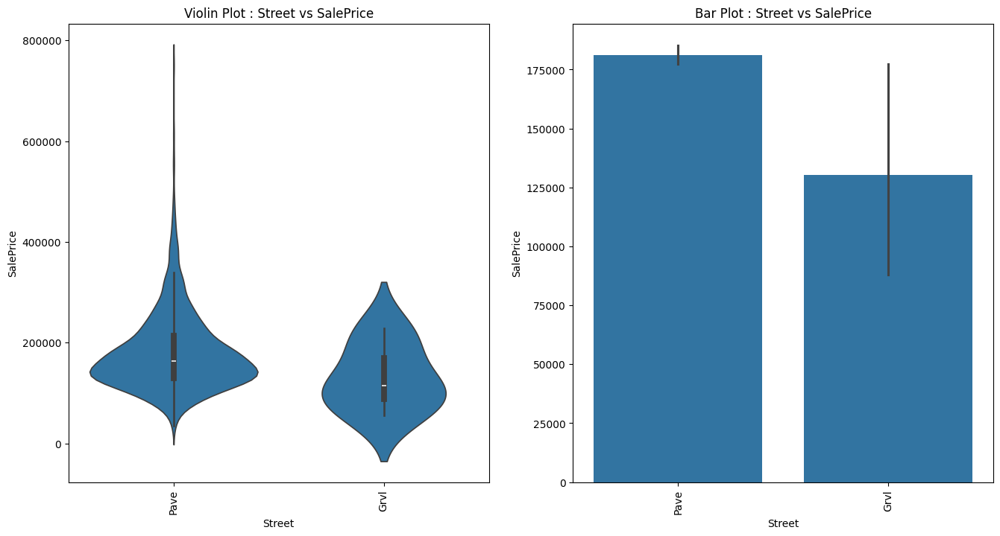

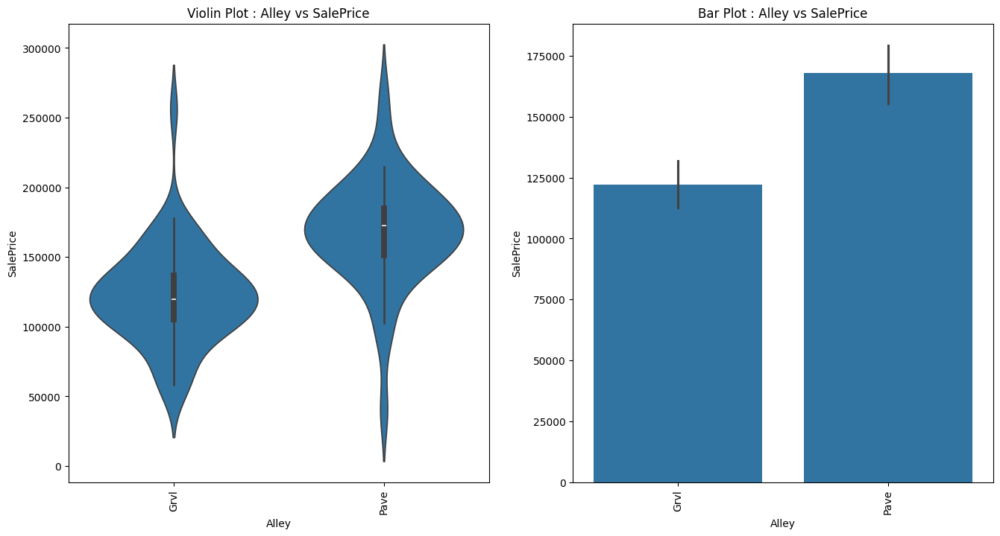

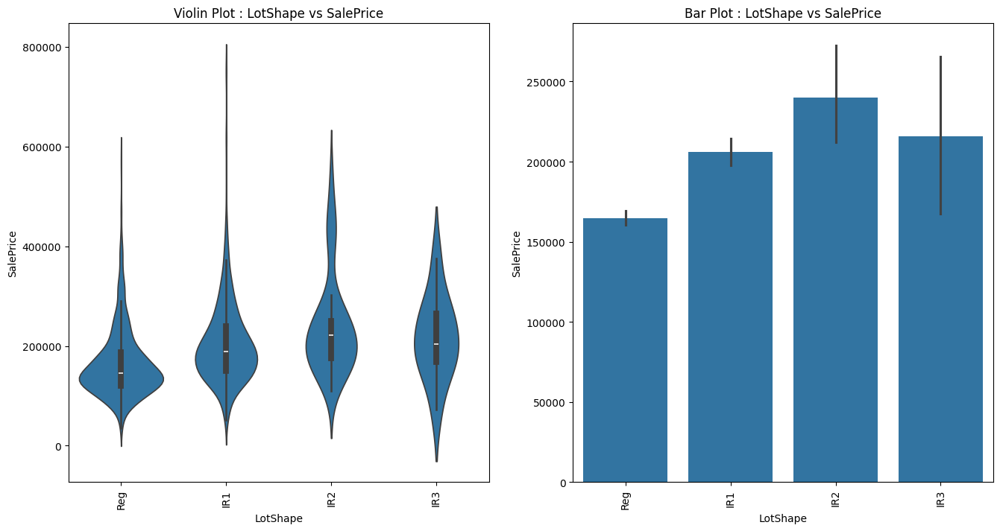

...

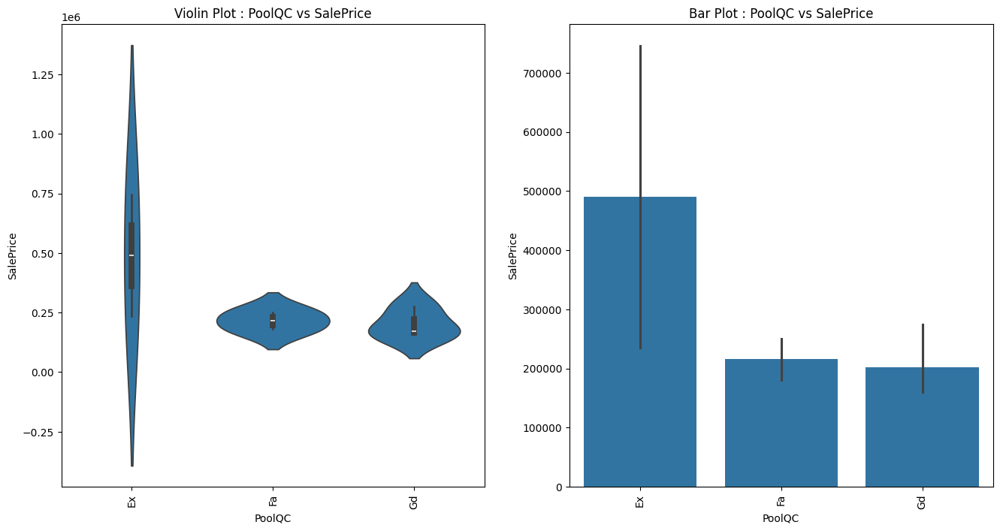

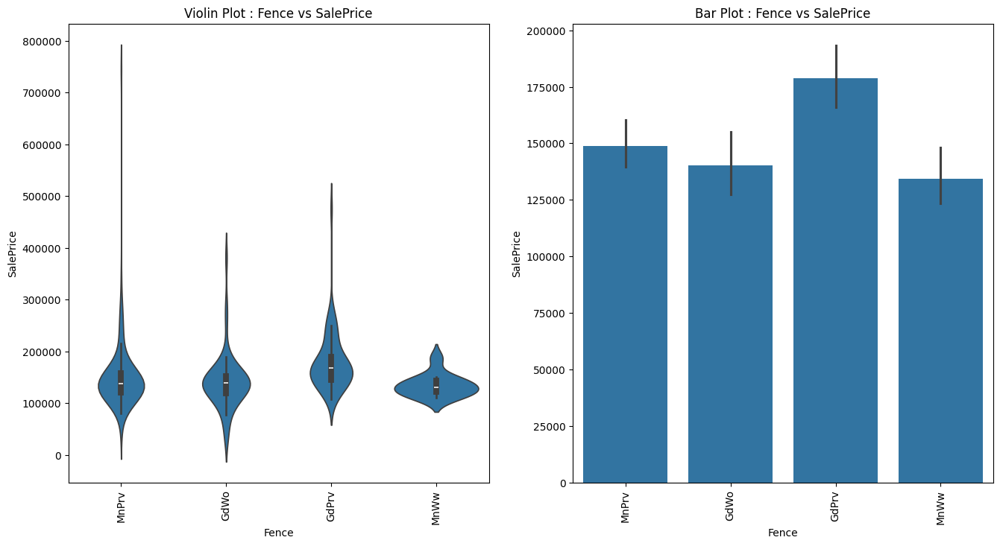

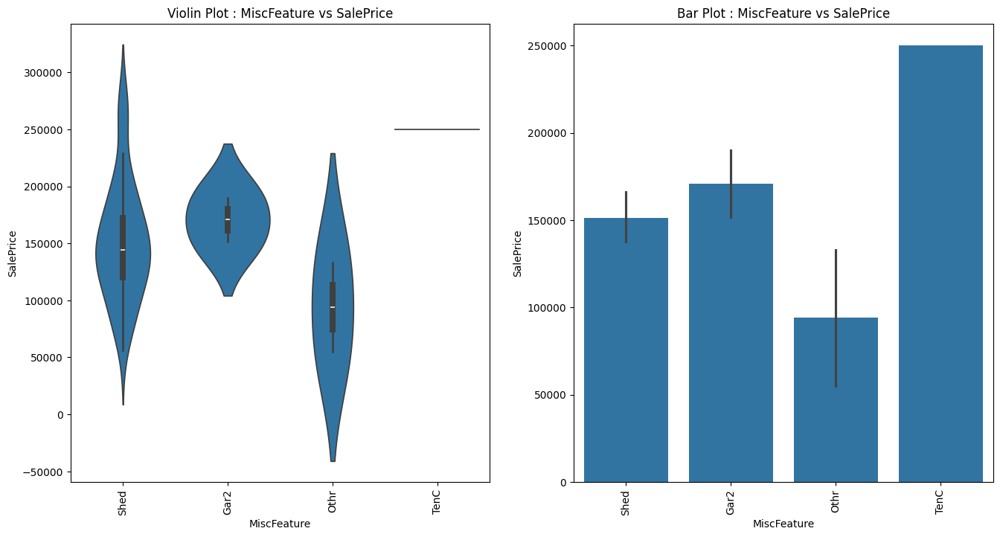

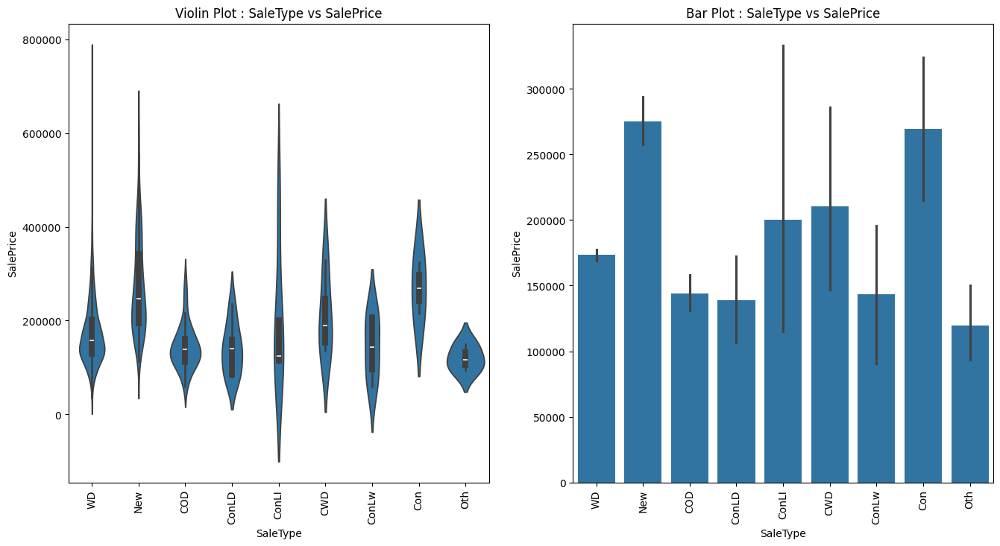

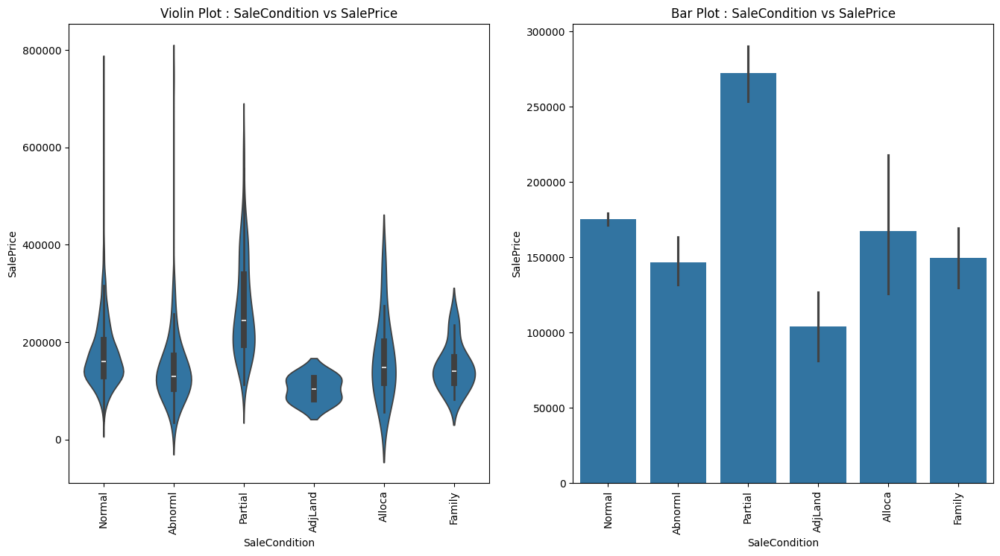

In [25]:
for col in cat_cols:
    fig, ax = plt.subplots(1,2,figsize = (16,8))
    sns.violinplot(data=train_df, x=col, y=Target, ax=ax[0])
    ax[0].set_title(f"Violin Plot : {col} vs {Target}")
    ax[0].tick_params(axis = "x", rotation = 90)
    sns.barplot(data = train_df, x=col, y=Target, ax=ax[1])
    ax[1].set_title(f"Bar Plot : {col} vs {Target}")
    ax[1].tick_params(axis = "x", rotation = 90)
    plt.show()

# Categorical Bivariate Analysis (Columns vs Target)

- Floating Village Residential have higher mean price than other Zones
- Paved Alley houses has higher house price
- Hillside Houses get Higher house price
- Northridge, Northridge Heights and Stone Brook has higer mean price.
- Highest Quality House gets more Value
- Houses with Excelent Quality Basement, Porch

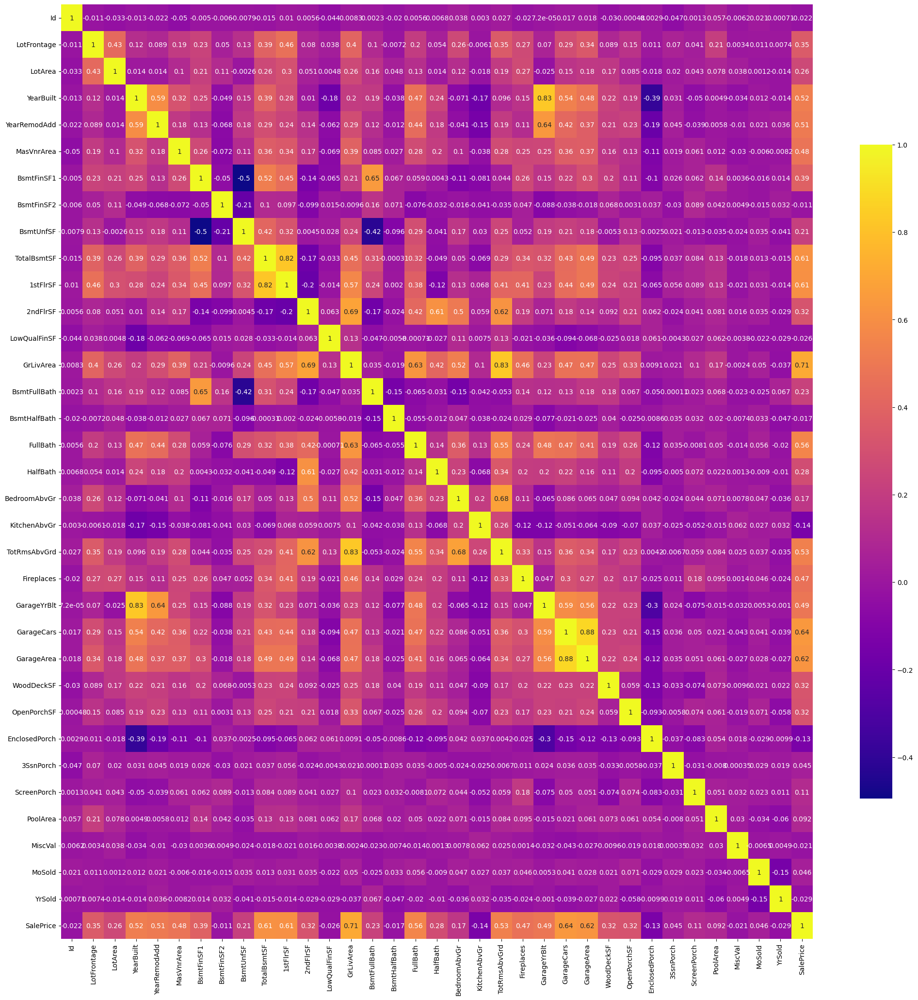

In [26]:
# Multivariate Analysis

corr = train_df.corr(numeric_only=True)
plt.figure(figsize=(25,25))
sns.heatmap(corr, cmap= 'plasma', cbar_kws = {"shrink" : 0.7}, annot=True)
plt.show()

# Observation

- YearBuilt vs GarageYrBlt - **0.83**
- TotRmsAbvGrd vs GrLivArea - **0.83**
- GarageArea vs GarageCars - **0.88**
- TotalBsmtSF vs 1stFlrSF - **0.82**

These columns high colinearity

In [27]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
temp_df = train_df.drop(columns=[Target])
VIF_needed = temp_df.select_dtypes(include="number")
VIF_needed = VIF_needed.replace([np.inf, -np.inf], np.nan).dropna()

VIF_data = pd.DataFrame({
    "Feature": VIF_needed.columns,
    "VIF": [variance_inflation_factor(VIF_needed.values, i)
            for i in range(VIF_needed.shape[1])]
})

print(VIF_data.sort_values("VIF", ascending=False))

del temp_df
del VIF_data
del VIF_needed


c:\Users\rishy\AppData\Local\Programs\Python\Python314\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


          Feature           VIF
8       BsmtUnfSF           inf
9     TotalBsmtSF           inf
13      GrLivArea           inf
12   LowQualFinSF           inf
7      BsmtFinSF2           inf
6      BsmtFinSF1           inf
11       2ndFlrSF           inf
10       1stFlrSF           inf
22    GarageYrBlt  2.654137e+04
33         YrSold  2.299206e+04
3       YearBuilt  2.017914e+04
4    YearRemodAdd  1.884586e+04
20   TotRmsAbvGrd  8.209286e+01
23     GarageCars  3.934108e+01
19   KitchenAbvGr  3.585327e+01
24     GarageArea  3.501285e+01
18   BedroomAbvGr  3.180498e+01
16       FullBath  2.843246e+01
1     LotFrontage  1.551319e+01
32         MoSold  6.767359e+00
0              Id  4.106946e+00
14   BsmtFullBath  3.625662e+00
17       HalfBath  3.589828e+00
2         LotArea  3.438485e+00
21     Fireplaces  2.941205e+00
26    OpenPorchSF  1.964869e+00
25     WoodDeckSF  1.935884e+00
5      MasVnrArea  1.927112e+00
27  EnclosedPorch  1.436492e+00
29    ScreenPorch  1.236595e+00
15   Bsm

# Columns with Multi-Collinearity bases on VIF 

### Basement Features
- BsmtUnfSF
- TotBsmtSF
- BsmtFinSF1
- BsmtFinSF2

- ### Living Area Features
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- LowQualFinSF
- TotRmsAbvGrd
- KitchenAbvGr
- BedroomAbvGr

### Year
- GarageYrBlt
- YrSold
- YearBuilt
- YearRemodAdd

### Garage
- GarageCars
- GarageArea
- FullBath
- LotFrontage

### Measures
- Create HouseAge Feature by YrSold - YearBuilt
- Create RemodAge Feature by YrSold - YearRemodAdd
- Create GarageAge Feature by YrSold - GarageYrBlt
- From Basement Features will keed only TotBsmtSF as BsmtFinSF1 + BsmtFinSF2 + BsmtUnfSF = TotBsmtSF
- From Living Area Features will keep only TotRmsAbvGr as 1stFlrSF + 2ndFlrSF + GrLivArea + LowQualFinSF + TotRmsAbvGrd + KitchenAbvGr + BedroomAbvGr = TotRmsAbvGr
- Drop YearBuilt, YearRemodAdd, GarageYrBlt and YrSold as created new features

In [28]:
train_df["HouseAge"] = train_df["YrSold"] - train_df["YearBuilt"]
train_df["RemodAge"] = train_df["YrSold"] - train_df["YearRemodAdd"]
train_df["GarageAge"] = train_df["YrSold"] - train_df["GarageYrBlt"]

train_df.drop(columns=["BsmtFinSF1",
                        "BsmtFinSF2",
                        "BsmtUnfSF",
                        "1stFlrSF",
                        "2ndFlrSF", 
                        "LowQualFinSF",
                        "YearBuilt",
                        "YearRemodAdd",
                        "GarageYrBlt",
                        "BedroomAbvGr", 
                        "TotRmsAbvGrd",
                        "KitchenAbvGr", 
                        "GarageCars",
                        "YrSold",
                        "GarageAge",
                        "FullBath",
                        "Id"], inplace=True)

In [29]:
temp_df = train_df.drop(columns=[Target])
VIF_needed = temp_df.select_dtypes(include="number")
VIF_needed = VIF_needed.replace([np.inf, -np.inf], np.nan).dropna()

VIF_data = pd.DataFrame({
    "Feature": VIF_needed.columns,
    "VIF": [variance_inflation_factor(VIF_needed.values, i)
            for i in range(VIF_needed.shape[1])]
})

print(VIF_data.sort_values("VIF", ascending=False))

del temp_df
del VIF_data
del VIF_needed

          Feature        VIF
4       GrLivArea  21.834277
3     TotalBsmtSF  13.092874
0     LotFrontage  12.759461
9      GarageArea   9.441795
17         MoSold   5.525189
18       HouseAge   5.268194
19       RemodAge   3.495499
1         LotArea   3.367654
8      Fireplaces   2.515974
7        HalfBath   2.244440
5    BsmtFullBath   1.912602
10     WoodDeckSF   1.862152
11    OpenPorchSF   1.796055
2      MasVnrArea   1.787283
12  EnclosedPorch   1.414236
14    ScreenPorch   1.200142
6    BsmtHalfBath   1.096704
15       PoolArea   1.088968
16        MiscVal   1.071888
13      3SsnPorch   1.031073


<Axes: >

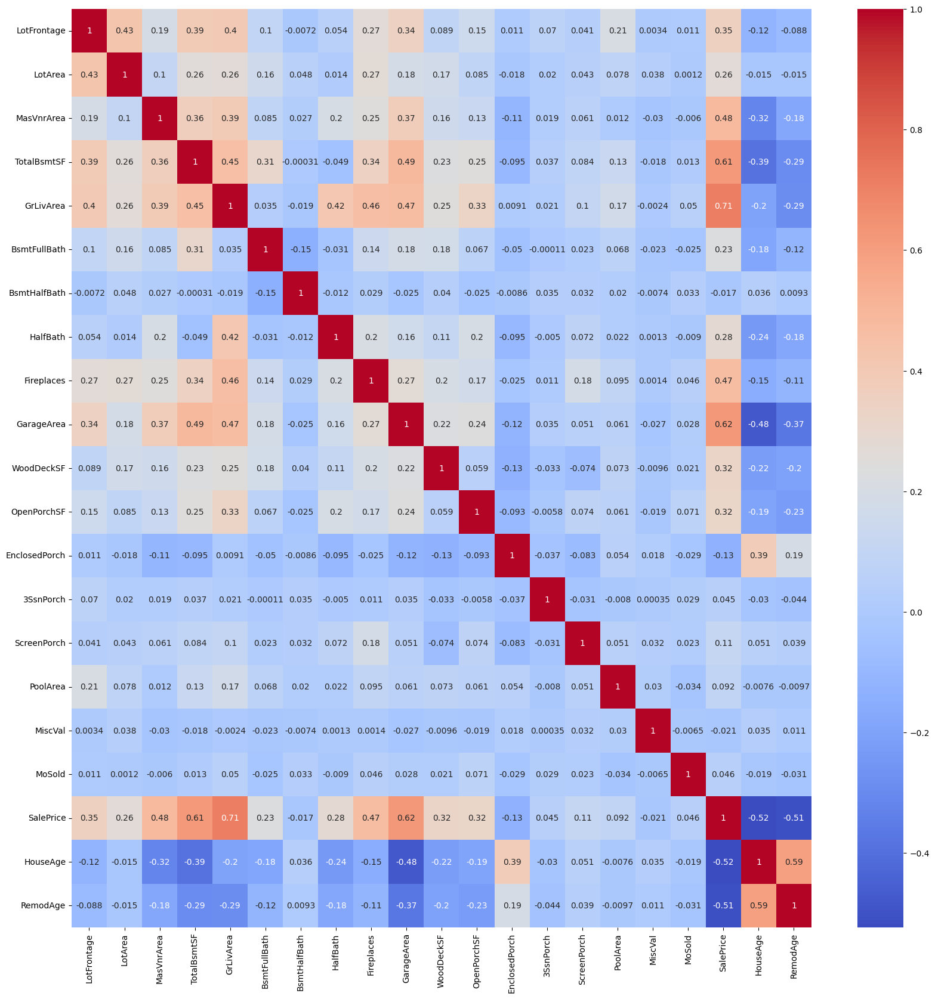

In [30]:
corr = train_df.corr(numeric_only=True)
plt.figure(figsize=(20,20))
sns.heatmap(corr, cmap='coolwarm', annot=True)

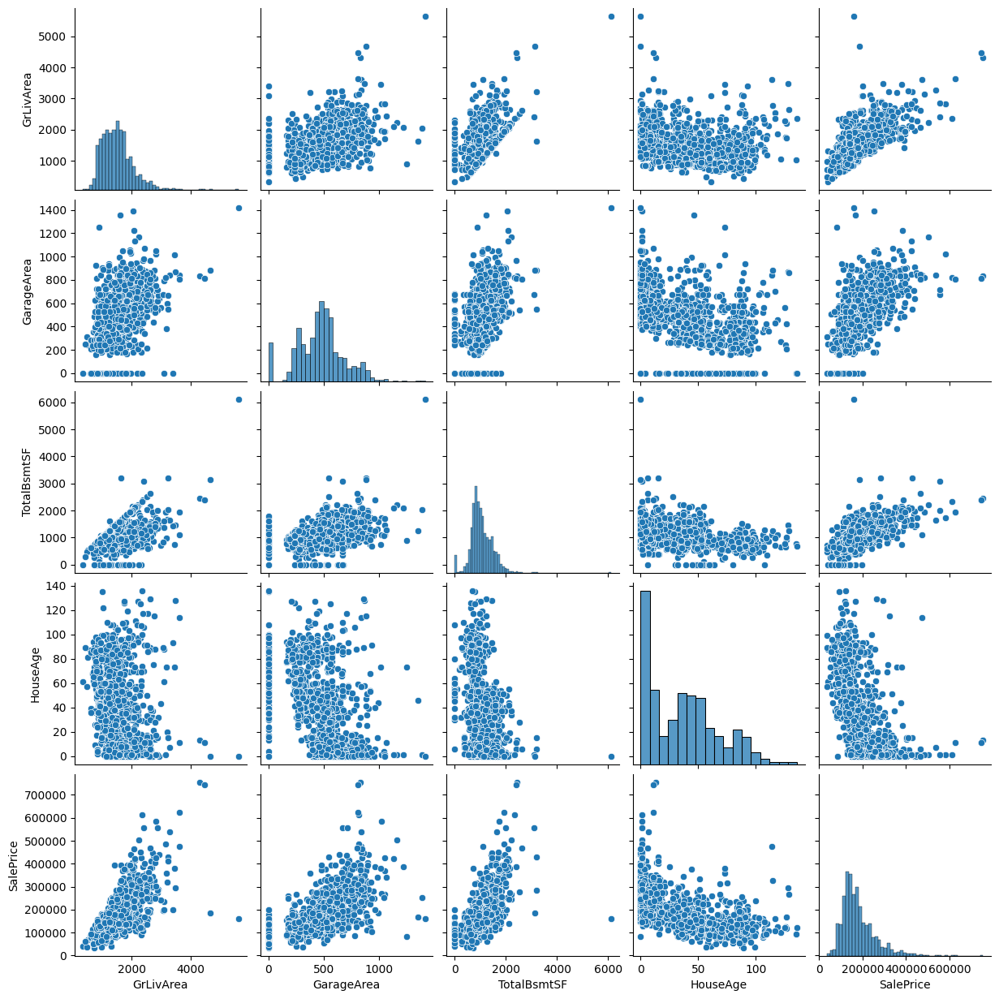

In [31]:
top_columns = ["GrLivArea", "GarageArea", "TotalBsmtSF", "HouseAge", "SalePrice"]

sns.pairplot(data=train_df[top_columns])

### Observation

The pairwise relationships indicate that living area and basement size have strong positive correlations with house price, while house age shows a negative association. Garage area contributes moderately to price prediction. The distributions are right-skewed, suggesting potential benefit from logarithmic transformation. A few large-area outliers are observed and may influence linear models.

## Feature Engneering

*Nominal category → One-hot* \
*Ordered category → Ordinal encoding* \
*Continuous number → Scaling* \
*Target → Log transform* 

**Columns needs to be Log-Transformed**
- SalePrice


**Columns needs to be Standard-Scaled**
- LotArea
- LotFrontage
- MasVnrArea
- TotalBsmtSF
- GarageArea
- WoodDeckSF
- OpenPorchSF
- EnclosedPorch
- 3SsnPorch
- ScreenPorch
- PoolArea
- GrLivArea
- HouseAge
- RemodAge

**Columns need to be Hot-Encoded**
- MSSubClass
- MSZoning
- Street
- Alley
- LotShape
- LandContour
- Utilities
- LotConfig
- Neighborhood
- BldgType
- HouseStyle
- RoofStyle
- RoofMatl  
- Exterior1st
- Exterior2nd
- MasVnrType
- Foundation
- BsmtFinType1
- BsmtFinType2
- Heating
- CentralAir
- Electrical
- GarageType  
- GarageFinish
- PavedDrive
- PoolQC
- Fence
- MiscFeature
- SaleType
- SaleCondition

## Ordinal Encoding
- ExterQual
- ExterCond
- BsmtQual
- BsmtCond
- HeatingQC
- KitchenQual
- FireplaceQu
- GarageQual
- GarageCond
- Functional
- BsmtExposure

# Pipeline Workflow

1. Convert ["MSSubClass", "OverallQual", "OverallCond"] to Category
2. Fill LotFrontAge with Mean
3. Fill MasVnrArea with '0'
4. Fill NA from [MasVnrType, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, FireplaceQu, GarageType, GarageQual, GarageCond, PoolQC, Fence, MiscFeature]
5. Create HouseAge Feature by YrSold - YearBuilt
6. Create RemodAge Feature by YrSold - YearRemodAdd
7. Create GarageAge Feature by YrSold - GarageYrblt
8. Drop Columns :  [BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, 1stFlrSF , 2ndFlrSF, LowQualFinSF, YearBuilt, YearRemodAdd, GarageYrBlt, BedroomAbvGr, TotRmsAbvGrd, KitchenAbvGr, GarageCars, YrSold, GarageAge, FullBath, Id]
9. Log-Transformation : [SalePrice ]
10. Standard-Scaling : [LotArea, LotFrontage, MasVnrArea, TotalBsmtSF,GarageArea, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, GrLivArea, HouseAge, RemodAge]
11. Hot-Encoding : [MSSubClass, MSZoning, Street, Alley, LotShape, LandContour, Utilities, LotConfig, Neighborhood, BldgType, HouseStyle, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, Foundation,  BsmtFinType1, BsmtFinType2, Heating, CentralAir, Electrical, GarageType, GarageFinish, PavedDrive, PoolQC, Fence, MiscFeature, SaleType, SaleCondition]
12. Ordinal Encoing : [ExterQual, ExterCond, BsmtQual, BsmtCond, HeatingQC, KitchenQual, FireplaceQu, GarageQual, GarageCond, Functional, BsmtExposure]


In [257]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression

In [258]:
from sklearn.linear_model import LassoCV

In [259]:
from sklearn.base import BaseEstimator, TransformerMixin

class FeatureEngineering(BaseEstimator, TransformerMixin):

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = X.copy()

        # Convert dtype
        X[["MSSubClass","OverallQual","OverallCond"]] = \
            X[["MSSubClass","OverallQual","OverallCond"]].astype("category")

        # Fill NA
        X["LotFrontage"] = X["LotFrontage"].fillna(X["LotFrontage"].mean())
        X["MasVnrArea"] = X["MasVnrArea"].fillna(0)

        cat_na = [
            "MasVnrType","BsmtQual","BsmtCond","BsmtExposure",
            "BsmtFinType1","BsmtFinType2","FireplaceQu",
            "GarageType","GarageQual","GarageCond",
            "PoolQC","Fence","MiscFeature"
        ]
        X[cat_na] = X[cat_na].fillna("NA")

        # Age features
        X["HouseAge"] = X["YrSold"] - X["YearBuilt"]
        X["RemodAge"] = X["YrSold"] - X["YearRemodAdd"]
        X["GarageAge"] = (X["YrSold"] - X["GarageYrBlt"]).fillna(0)

        # Drop columns
        drop_cols = ["BsmtFinSF1","BsmtFinSF2","BsmtUnfSF",
            "1stFlrSF","2ndFlrSF","LowQualFinSF",
            "YearBuilt","YearRemodAdd","GarageYrBlt",
            "BedroomAbvGr","TotRmsAbvGrd","KitchenAbvGr",
            "GarageCars","YrSold","GarageAge",
            "FullBath","Id", "Electrical", 
]

        X = X.drop(columns=[c for c in drop_cols if c in X.columns])

        return X


In [260]:
numeric_cols = [
    "LotArea","LotFrontage","MasVnrArea","TotalBsmtSF",
    "GarageArea","WoodDeckSF","OpenPorchSF","EnclosedPorch",
    "3SsnPorch","ScreenPorch","PoolArea",
    "GrLivArea","HouseAge","RemodAge"
]

nominal_cols = [
    "MSSubClass","MSZoning","Street","LotShape",
    "LandContour","Utilities","LotConfig","Neighborhood","LandSlope",
    "BldgType","HouseStyle","RoofStyle","RoofMatl",
    "Exterior1st","Exterior2nd","MasVnrType","Foundation",
    "BsmtFinType1","BsmtFinType2","Heating","CentralAir","GarageType","GarageFinish","PavedDrive",
    "PoolQC","Fence","MiscFeature","SaleType","SaleCondition","Condition1", "Condition2"
]

ordinal_cols = [
    "ExterQual","ExterCond","BsmtQual","BsmtCond","HeatingQC",
    "KitchenQual","FireplaceQu","GarageQual","GarageCond",
    "Functional","BsmtExposure"
]


In [261]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_cols),
        ("nom", OneHotEncoder(handle_unknown="ignore"), nominal_cols),
        ("ord", OrdinalEncoder(), ordinal_cols),
    ], remainder="passthrough")


In [262]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

pipeline = Pipeline([
    ("feature_engineering", FeatureEngineering()),
    ("preprocessing", preprocessor),
    ("model", LinearRegression())
])

train_df = pd.read_csv("train.csv")
X = train_df.drop("SalePrice", axis=1)
y = np.log1p(train_df["SalePrice"])

X_train,x_test, y_train, y_test = train_test_split(X,y, test_size= 0.2 , random_state=42)

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(x_test)

print("Test R²:", r2_score(y_test, y_pred))



Test R²: 0.9108295624222301


# Conclusion

A machine learning pipeline was developed to predict house prices using preprocessing, feature engineering, and regularized linear models. Missing values and categorical variables were handled systematically to prevent data leakage and improve model stability. The final model achieved an R² score of about 0.91 on test data, showing strong predictive performance. This project highlights the importance of proper preprocessing and feature engineering in tabular data modeling.